# 1. Helper Functions

In [1]:
class Helper():
  def unnormalize(self, img, pixel_std, pixel_mean):
    img_T = img.numpy().transpose((1,2,0))
    img_T = pixel_std * img_T + pixel_mean # Unnormalize
    img_T = np.clip(img_T, 0, 1)
    return img_T

In [2]:
helper = Helper()

# 2. Dataset
We will use the Anime Face Dataset which consists of 60,000 images of anime faces.

## 2.1 Kaggle

In [3]:
from google.colab.files import upload

In [4]:
print("Installing kaggle")
!pip install kaggle -q
print("Upload kaggle.json")
upload()
print("Setting kaggle up...")
!mkdir ~/.kaggle
!mv kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json
!rm -fr sample_data
print("Done!")

Installing kaggle
Upload kaggle.json


Saving kaggle.json to kaggle.json
Setting kaggle up...
Done!


## 2.2 Dataset class

In [5]:
import os, shutil
import numpy as np
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [209]:
class Dataset():
  def __init__(self, root_dir, img_size, batch_size, pixel_mean, pixel_std):
    self.root_dir = root_dir
    self.img_size = img_size
    self.batch_size = batch_size
    self.pixel_mean = pixel_mean
    self.pixel_std = pixel_std
  
  def _download_dataset(self):
    if os.path.isdir(self.root_dir):
      return
    
    !kaggle datasets download -d splcher/animefacedataset
    print("Unzipping dataset...")
    !unzip -q animefacedataset.zip
    print("Setting everything up...")
    !rm -fr animefacedataset.zip
    os.mkdir(self.root_dir)
    shutil.move("images", self.root_dir)
    print("Done!")

  def _get_tfms(self):
    transformations = transforms.Compose([
        transforms.Resize(self.img_size),
        transforms.CenterCrop(self.img_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=self.pixel_mean, std=self.pixel_std)
    ])

    return transformations
  
  def get_dataset(self):
    self._download_dataset()
    transformations = self._get_tfms()
    train_ds = datasets.ImageFolder(root=self.root_dir, transform=transformations)
    return train_ds
  
  def load_dataset(self, train_ds):
    train_dl = DataLoader(train_ds, batch_size=self.batch_size, shuffle=True)
    return train_dl
  
  def display_images(self, num_examples, dl):
    X, y = next(iter(dl))

    figure = plt.figure(figsize=(10,10))
    figure.tight_layout()
    title_ax = figure.add_axes([0.5, 0.9, 0.1, 0.01])
    title_ax.set_axis_off()

    for i in range(num_examples):
      plt.subplot(6,6,i+1)
      img_T = helper.unnormalize(X[i], self.pixel_std, self.pixel_mean)
      plt.imshow(img_T)
      plt.axis("off")
    
    title_ax.set_title("Anime faces")
    plt.show()

In [210]:
ROOT_DIR = "dataset"
IMG_SIZE = 64
BATCH_SIZE = 128
PIXEL_MEAN = (0.5,0.5,0.5)
PIXEL_STD = (0.5,0.5,0.5)

In [211]:
data = Dataset(ROOT_DIR, IMG_SIZE, BATCH_SIZE, PIXEL_MEAN, PIXEL_STD)

In [9]:
train_ds = data.get_dataset()
train_dl = data.load_dataset(train_ds)

100% 395M/395M [00:12<00:00, 42.5MB/s]
100% 395M/395M [00:12<00:00, 33.5MB/s]
Unzipping dataset...
Setting everything up...
Done!


In [10]:
len(train_ds), len(train_dl), train_ds[5][0].shape

(63565, 497, torch.Size([3, 64, 64]))

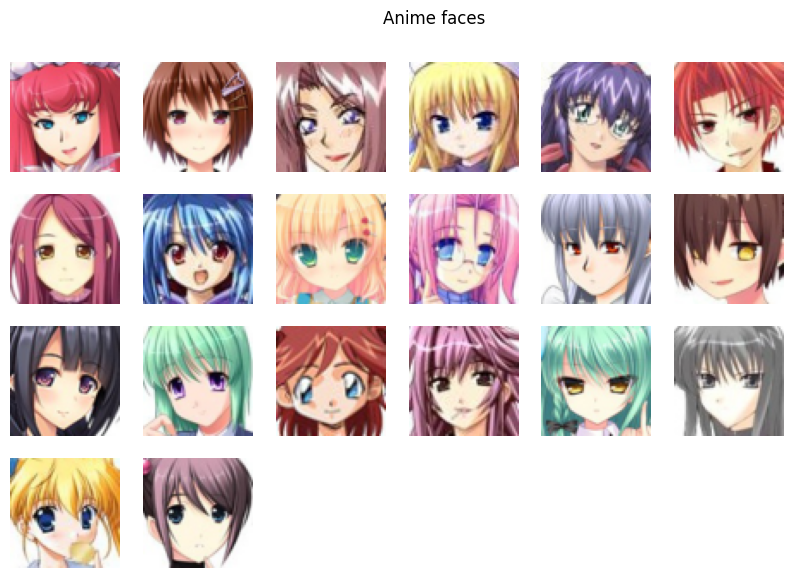

In [212]:
data.display_images(20, train_dl)

# 3. Neural Networks
We will have two neural networks, the discriminator and the generator. The discriminator will classify images into real or fake and the generator will make images to try to fool the discriminator

In [12]:
import torch
from torch import nn

In [13]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## 3.1 Discriminator

In [70]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()

    self.main = nn.Sequential(
      # in: 3 x 64 x 64

      nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(64),
      nn.LeakyReLU(0.2, inplace=True),
      # out: 64 x 32 x 32

      nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(128),
      nn.LeakyReLU(0.2, inplace=True),
      # out: 128 x 16 x 16

      nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(256),
      nn.LeakyReLU(0.2, inplace=True),
      # out: 256 x 8 x 8

      nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(512),
      nn.LeakyReLU(0.2, inplace=True),
      # out: 512 x 4 x 4

      nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
      # out: 1 x 1 x 1

      nn.Flatten(),
      nn.Sigmoid()
    )

  def forward(self, input):
    return self.main(input)

In [71]:
discriminator = Discriminator().to(device)
print(discriminator)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(512, 1, kernel_size=(

## 3.2 Generator

In [72]:
LATENT_SIZE = 128

In [73]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator, self).__init__()

    self.main = nn.Sequential(
      nn.ConvTranspose2d(LATENT_SIZE, 512, kernel_size=4, stride=1, padding=0, bias=False),
      nn.BatchNorm2d(512),
      nn.ReLU(True),
      # out: 512 x 4 x 4

      nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(256),
      nn.ReLU(True),
      # out: 256 x 8 x 8

      nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(128),
      nn.ReLU(True),
      # out: 128 x 16 x 16

      nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
      nn.BatchNorm2d(64),
      nn.ReLU(True),
      # out: 64 x 32 x 32
  
      nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
      nn.Tanh()
      # out: 3 x 64 x 64
    )
  
  def forward(self, input):
    return self.main(input)

In [74]:
generator = Generator().to(device)
generator

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

torch.Size([128, 3, 64, 64])


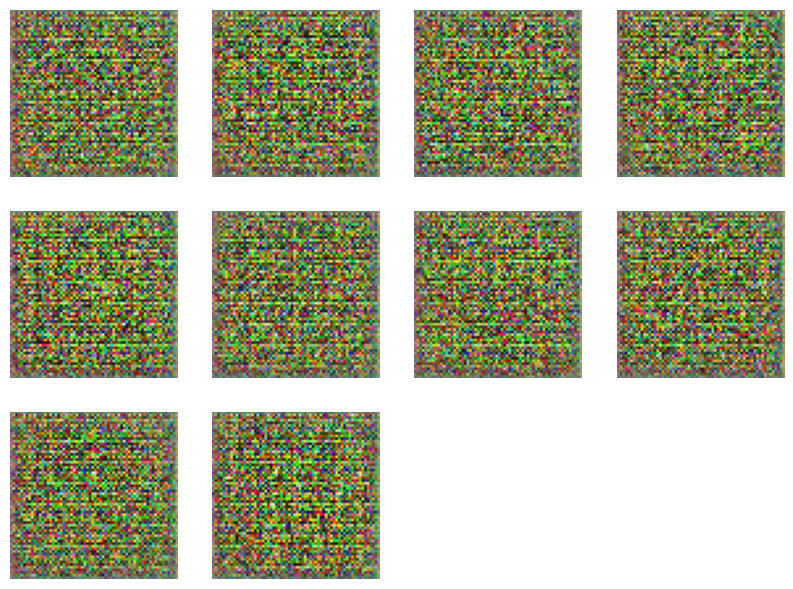

In [75]:
xb = torch.randn(BATCH_SIZE, LATENT_SIZE, 1, 1, device=device) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)

figure = plt.figure(figsize=(10,10))
figure.tight_layout()

for i in range(10):
  plt.subplot(4,4,i+1)
  img_T = helper.unnormalize(fake_images[i].detach().cpu(), PIXEL_STD, PIXEL_MEAN)
  plt.imshow(img_T)
  plt.axis("off")

plt.show()

# 4. Train functions

In [20]:
from torch.nn import functional as F
from tqdm.notebook import tqdm
from torch import optim

In [213]:
class Trainer():
  def __init__(self, optim_d, optim_g, discriminator, generator, loss, epochs, latent_size):
    self.optim_d = optim_d
    self.optim_g = optim_g
    self.discriminator = discriminator
    self.generator = generator
    self.loss = loss
    self.epochs = epochs
    self.latent_size = latent_size
  
  def _train_discriminator(self, real_images):
      # Clear discriminator gradients
      self.optim_d.zero_grad()

      # Pass real images through discriminator
      real_preds = self.discriminator(real_images)
      real_targets = torch.ones(real_images.size(0), 1, device=device)
      real_loss = F.binary_cross_entropy(real_preds, real_targets)
      
      # Generate fake images
      latent = torch.randn(real_images.size(0), self.latent_size, 1, 1, device=device)
      fake_images = self.generator(latent)

      # Pass fake images through discriminator
      fake_targets = torch.zeros(real_images.size(0), 1, device=device)
      fake_preds = self.discriminator(fake_images.detach())
      fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)

      # Update discriminator weights
      loss = real_loss + fake_loss
      loss.backward()
      self.optim_d.step()
      return loss.item()
  
  def _train_generator(self):
    # Clear generator gradients
    self.optim_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(BATCH_SIZE, LATENT_SIZE, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(BATCH_SIZE, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    self.optim_g.step()
    
    return loss.item()
  
  def train_model(self, dl, imgs_dir):
    torch.cuda.empty_cache()
    if not os.path.isdir(imgs_dir):
      os.mkdir(imgs_dir)

    elif len(os.listdir(imgs_dir)) > 0:
      shutil.rmtree(imgs_dir)
      os.mkdir(imgs_dir)

    losses_g = []
    losses_d = []

    for epoch in range(self.epochs):
      print(f"------\nEpoch: {epoch+1}/{self.epochs}")
      for real_images, _ in tqdm(dl):
        real_images = real_images.to(device)
        loss_d = self._train_discriminator(real_images)
        loss_g = self._train_generator()
      
      losses_g.append(loss_g)
      losses_d.append(loss_d)

      print(f"loss_d: {loss_d}, loss_g: {loss_g}")

      latent = torch.randn(BATCH_SIZE, LATENT_SIZE, 1, 1, device=device)
      images = generator(latent)

      figure = plt.figure(figsize=(10,10))
      figure.tight_layout()

      for i in range(10):
        plt.subplot(6,6,i+1)
        img_T = helper.unnormalize(images[i].detach().cpu(), PIXEL_STD, PIXEL_MEAN)
        plt.imshow(img_T)
        plt.axis("off")

      plt.savefig(f"generated_images/img_at_epoch_{epoch+1}")
      plt.show()
  
    return losses_g, losses_d


# 5. Train model

In [85]:
optim_g = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
loss = F.binary_cross_entropy
epochs = 25

In [86]:
trainer = Trainer(optim_d, optim_g, discriminator, generator, loss, epochs, LATENT_SIZE)

------
Epoch: 1/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.6999151706695557, loss_g: 3.478714942932129


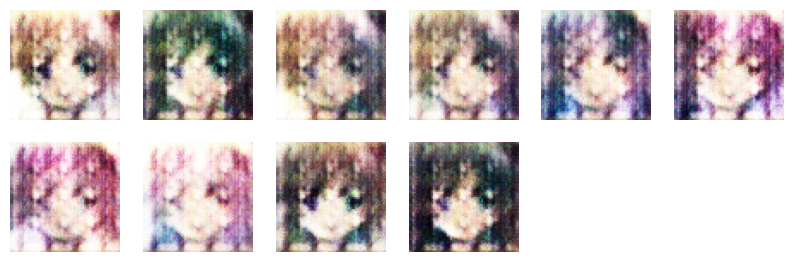

------
Epoch: 2/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.5078762769699097, loss_g: 4.130920886993408


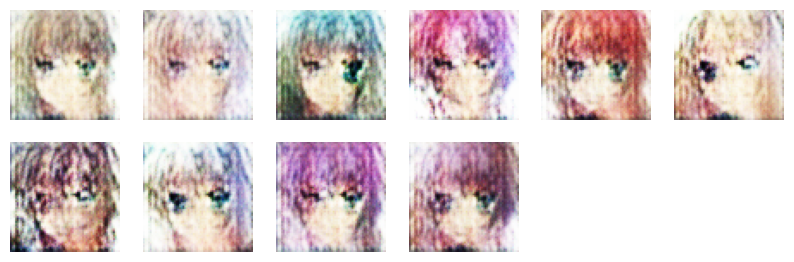

------
Epoch: 3/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.29427188634872437, loss_g: 4.426342964172363


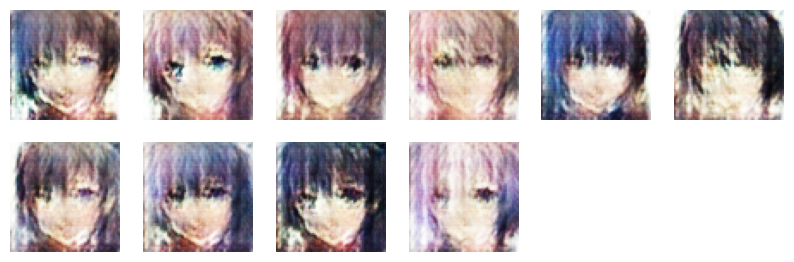

------
Epoch: 4/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.18562671542167664, loss_g: 4.491580963134766


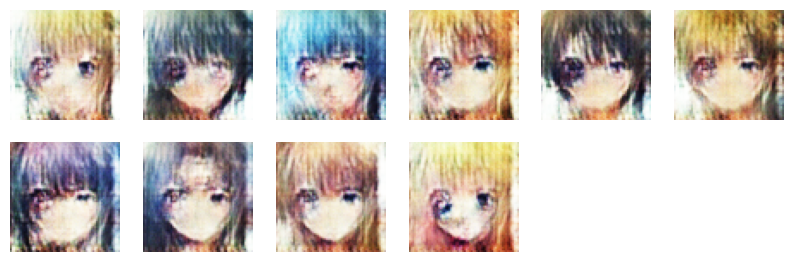

------
Epoch: 5/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.1545535922050476, loss_g: 4.903388023376465


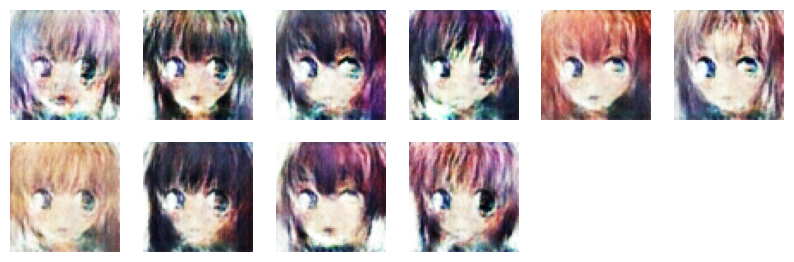

------
Epoch: 6/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.5352893471717834, loss_g: 9.425119400024414


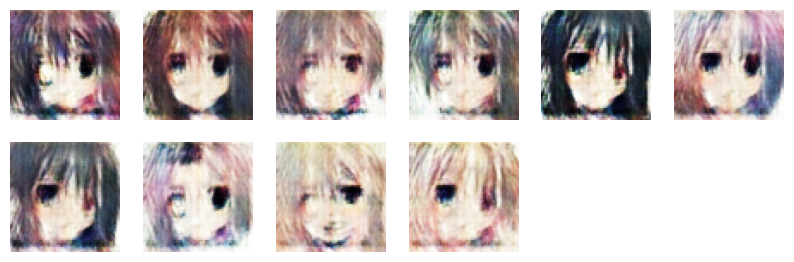

------
Epoch: 7/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.08438201993703842, loss_g: 5.752757549285889


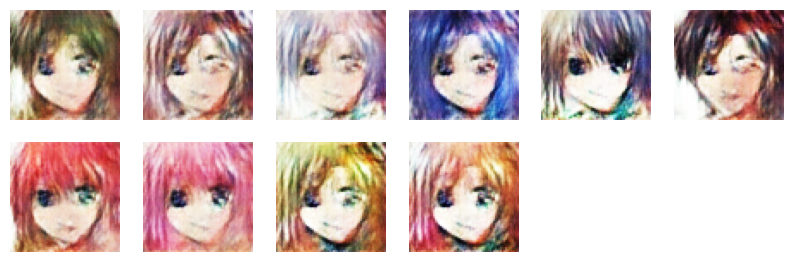

------
Epoch: 8/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.3977038562297821, loss_g: 10.616073608398438


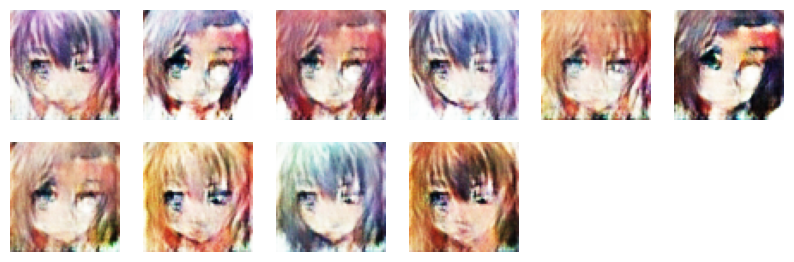

------
Epoch: 9/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.23364950716495514, loss_g: 14.007203102111816


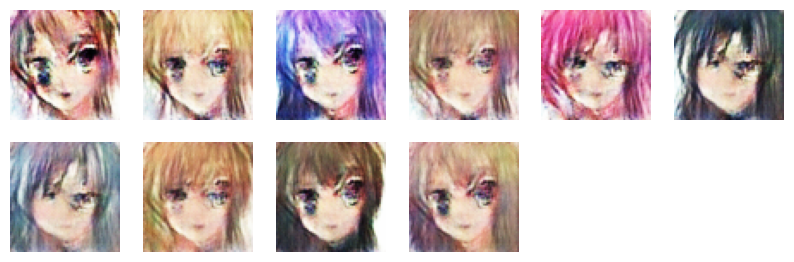

------
Epoch: 10/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.007000639569014311, loss_g: 4.679619312286377


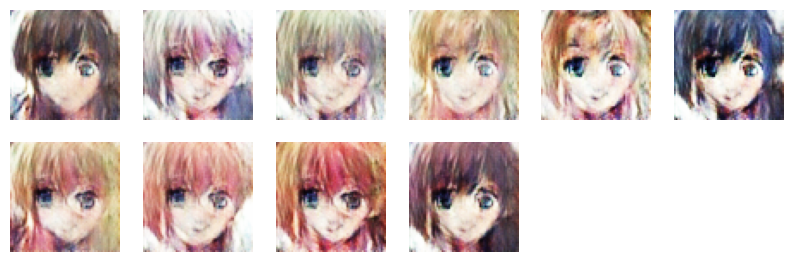

------
Epoch: 11/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.230658620595932, loss_g: 6.44541072845459


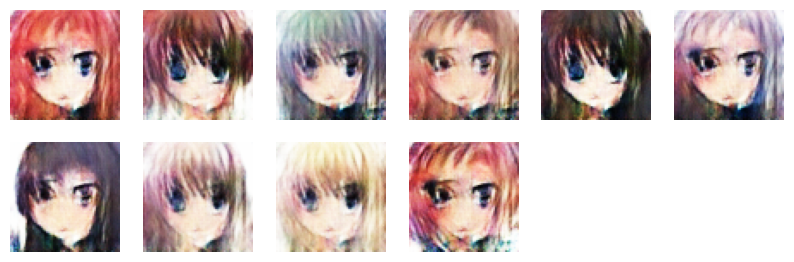

------
Epoch: 12/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.23513785004615784, loss_g: 10.907957077026367


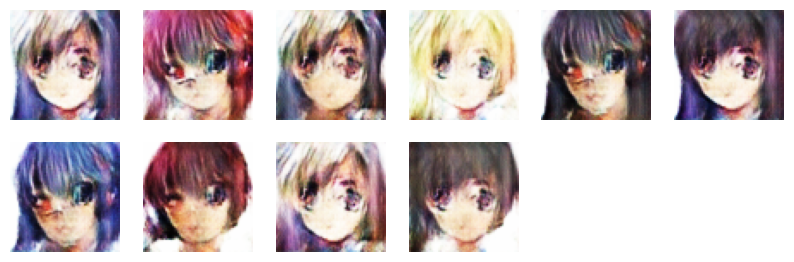

------
Epoch: 13/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.011352834291756153, loss_g: 11.580918312072754


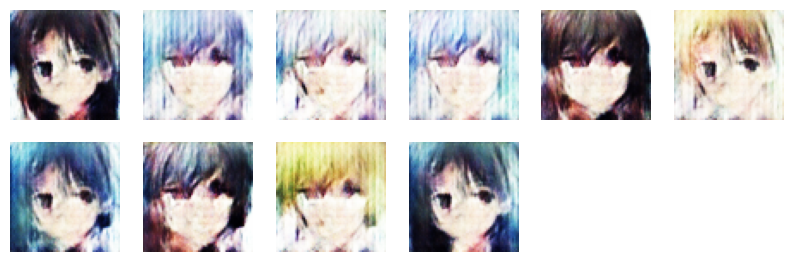

------
Epoch: 14/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.09260436147451401, loss_g: 5.745172500610352


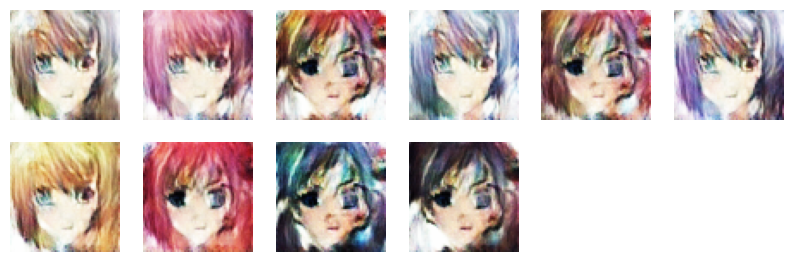

------
Epoch: 15/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.004716136027127504, loss_g: 10.878469467163086


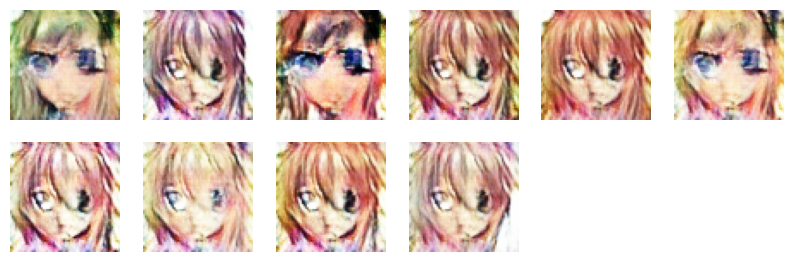

------
Epoch: 16/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.2541344463825226, loss_g: 16.424055099487305


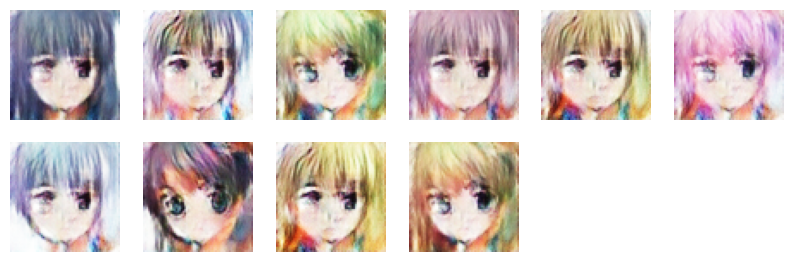

------
Epoch: 17/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.0032388465479016304, loss_g: 8.698472023010254


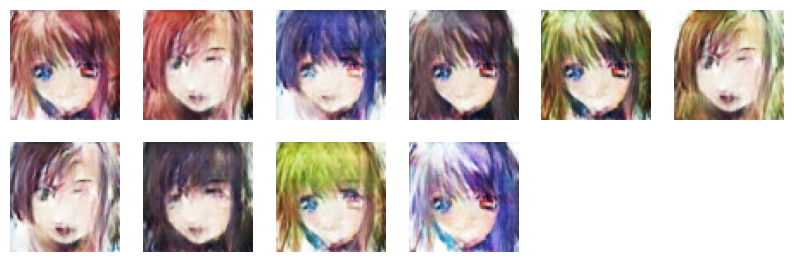

------
Epoch: 18/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.029484065249562263, loss_g: 8.11205768585205


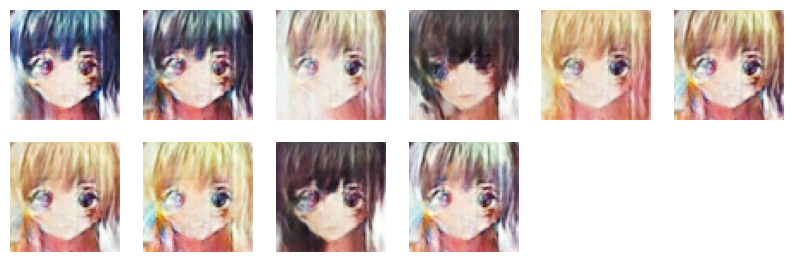

------
Epoch: 19/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.04575219377875328, loss_g: 7.910233020782471


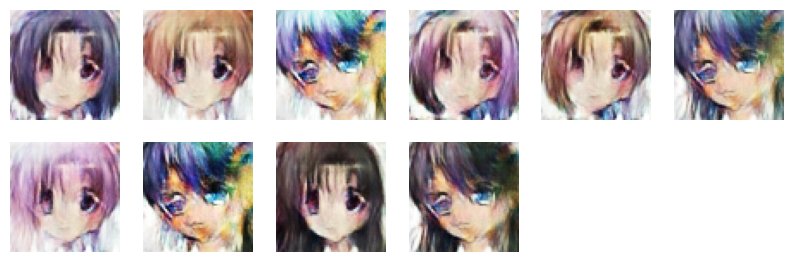

------
Epoch: 20/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.04223655164241791, loss_g: 5.826572895050049


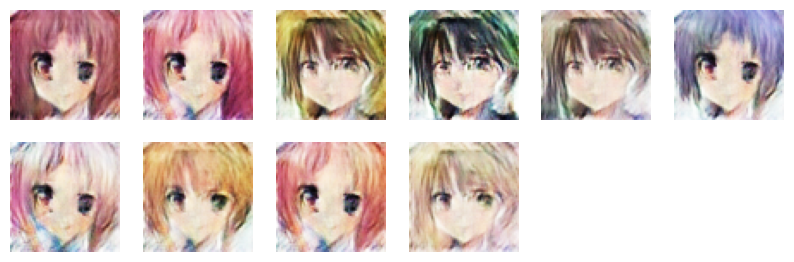

------
Epoch: 21/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.12912185490131378, loss_g: 8.735954284667969


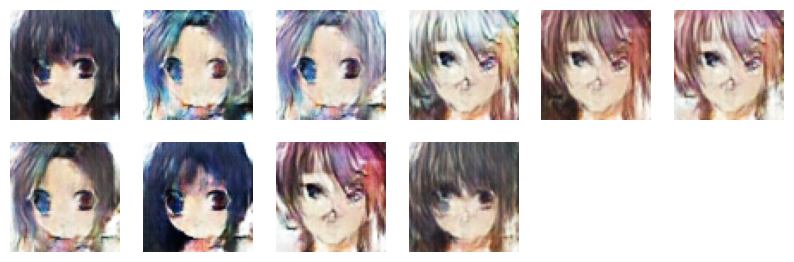

------
Epoch: 22/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 1.1635209321975708, loss_g: 11.98774528503418


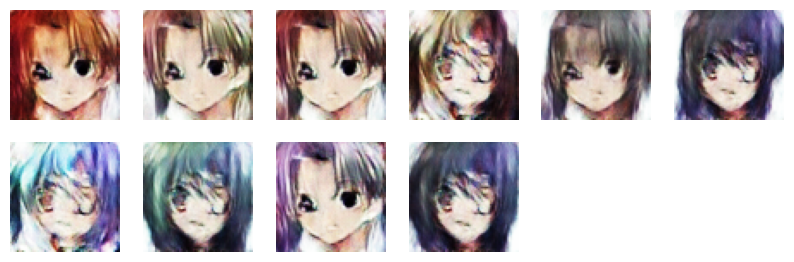

------
Epoch: 23/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.11443530023097992, loss_g: 6.989239692687988


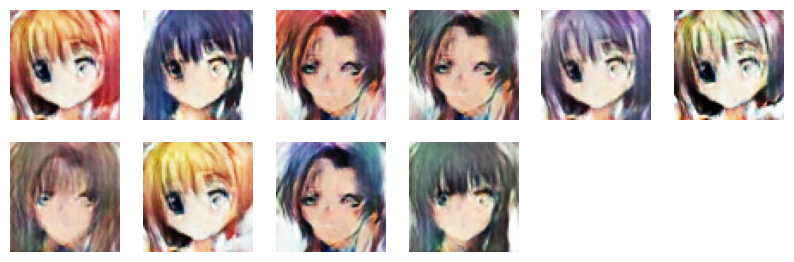

------
Epoch: 24/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.07999441027641296, loss_g: 15.797913551330566


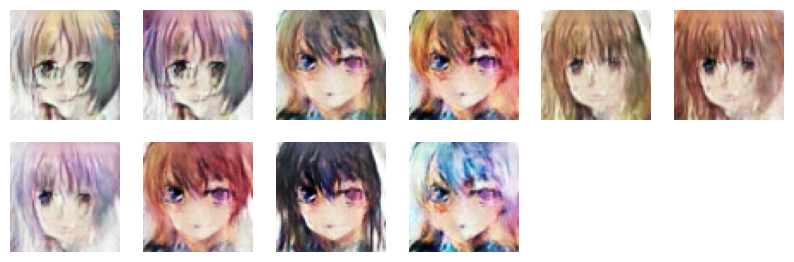

------
Epoch: 25/25


  0%|          | 0/497 [00:00<?, ?it/s]

loss_d: 0.05680300295352936, loss_g: 4.616672992706299


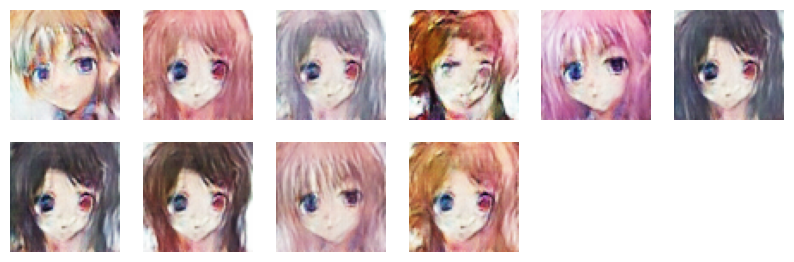

In [83]:
history = trainer.train_model(train_dl, "generated_images")

# 6. Evaluate model
For evaluation we first plot the losses for both the generator and discriminator, then we give our model some random noise and see it make it's own faces

In [164]:
import random

## 6.1 Plot loss

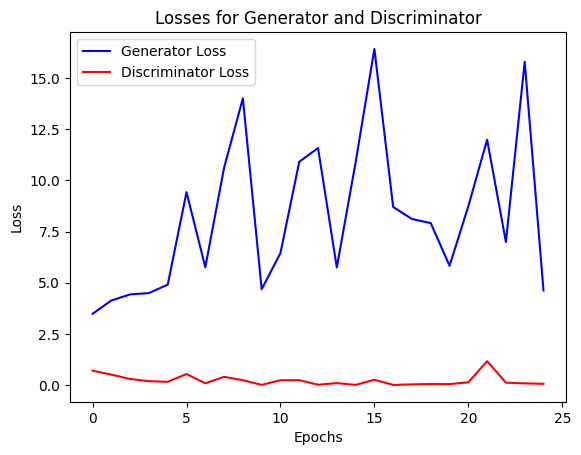

In [214]:
plt.plot(history[0], color="blue", label="Generator Loss")
plt.plot(history[1], color="red", label="Discriminator Loss")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Losses for Generator and Discriminator")
plt.show()

## 6.2 Predict

In [160]:
torch.cuda.empty_cache()

In [189]:
latent = torch.randn(1200, LATENT_SIZE, 1, 1, device=device)
imgs = generator(latent)

In [190]:
imgs_T = []
for i in range(len(imgs)):
  imgs_T.append(helper.unnormalize(imgs[i].detach().cpu(), PIXEL_STD, PIXEL_MEAN))

index: of image: 411


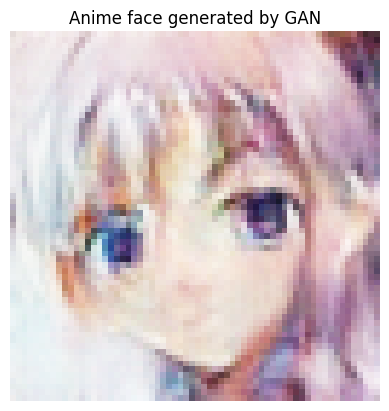

In [216]:
index = random.randrange(0,len(imgs_T))
print(f"index: of image: {index}")

plt.imshow(imgs_T[index])
plt.axis("off")
plt.title("Anime face generated by GAN")
plt.show()

# 7. Save and download models

## 7.1 Save models

In [202]:
generator_model_path = "models/generator"
discriminator_model_path = "models/discriminator"

In [200]:
os.makedirs(generator_model_path, exist_ok=True)
os.makedirs(discriminator_model_path, exist_ok=True)

In [203]:
torch.save(generator.state_dict(), f"{generator_model_path}/generator.h5")
torch.save(discriminator.state_dict(), f"{discriminator_model_path}/discriminator.h5")

## 7.2 Download models
We will zip the models folder and then just download it from the colab filesystem

In [205]:
!zip -r models.zip models

  adding: models/ (stored 0%)
  adding: models/generator/ (stored 0%)
  adding: models/generator/generator.h5 (deflated 7%)
  adding: models/discriminator/ (stored 0%)
  adding: models/discriminator/discriminator.h5 (deflated 7%)
